# Nota Técnica: API e dados abertos do Portal de Devolutivas do Programa de Metas 2021-2024
### <i>segunda parte</i>

### Introdução

Nesta segunda parte da Nota Técnica sobre o <b>Portal de Devolutivas do Programa de Metas 2021-2024</b>, o foco será a API. 

Iniciaremos o texto com uma breve explicação, para pessoas não-técnicas, sobre o que é uma API. 

Em seguida, por meio de um exemplo didático, mostraremos por que é importante desenvolver uma API, e por que é sempre melhor consultar dados por meio delas.

Feito isto, nos voltaremos aos detalhes técnicos da API do Portal de Devolutivas.  Nesta seção o leitor irá nos acompanhar em um tutorial, escrito em <i>python</i> sobre como consumir os dados da API. Por fim, apresentaremos um exemplo de aplicação que pode ser desenvolvida a partir dela. 

Com isso, esperamos que, ao final da leitura, uma pessoa que possui conhecimentos básicos de programação possa se apropriar da API do Portal de Devolutivas e compreender como consumir as informações por ela disponibilizadas. Esse conhecimento, aliado à descrição da metodologia e do dicionário de variáveis apresentados na Primeira Parte, permitirá à essa pessoa ter autonomia para desenvolver suas próprias análises e aplicações.


### O que é uma API?

API é uma sigla para a expressão <i> Aplication Programming Interface </i>, ou, em português, <i>interface de programação de aplicativos</i>.

Como o nome indica, uma API é, portanto, uma interface cuja principal utilidade é auxiliar no desenvolvimento de software. Mas o que isso quer dizer? O que significa ser uma <i>interface</i>?


![Gif com um garçom andando](garçom.gif 'Garçom')

In [ ]:
#### Sobre garçons e carros

Acredito que o melhr

In [ ]:
### Motivação - por quê construir uma API?

In [ ]:
import sqlite3
from sqlite3 import IntegrityError
import os
import pandas as pd

In [ ]:
class SistemaMercearia:
    
    coluna_itens = 'verdura'
    
    def __init__(self):
        
        self.banco_de_dados = self.conectar_banco_de_dados()
        
    def conectar_banco_de_dados(self):
        '''Faz a conexão ao banco de dados do sistema'''
        
        if 'mercearia.db' in os.listdir('.'):
            banco_de_dados = sqlite3.connect('mercearia.db')
        else:
            banco_de_dados = self.criar_banco_de_dados()
            
        print('Conectado ao banco de dados')
        return banco_de_dados
        
        
    def criar_banco_de_dados(self):
        '''Cria a estrutura do banco de dados do sistema, se ele já não existe.'''
    
        banco_de_dados = sqlite3.connect('mercearia.db')
        
        administrador = banco_de_dados.cursor()
        
        administrador.execute(f'''
        CREATE TABLE IF NOT EXISTS verduras 
                   (
                   verdura text unique, 
                   quantidade intenger, 
                   preco_unitario decimal);''')

        banco_de_dados.commit()
        administrador.close()
        
        print('Banco de dados criado')

        return banco_de_dados
    
    
    def cadastrar_item(self, nom_verdura, preco):
        '''Cadastra um novo item de estoque no sistema'''
    
        usuario = self.banco_de_dados.cursor()
        try:
            usuario.execute(f'''INSERT INTO verduras ({self.coluna_itens}, quantidade, preco_unitario) 
            VALUES(?, 0, ?)''', (nom_verdura, preco))

            self.banco_de_dados.commit()
            print(f'Item {nom_verdura} cadastrado com sucesso!')
        except IntegrityError:
            print(f'Item {nom_verdura} já cadastrado!')
            usuario.close()
            
            
    def atualizar_estoque(self, nom_verdura, quantidade):
        '''Atualiza a quantidade de um item de estoque no sistema,
        acrescentando os novos itens adquiridos ao estoque'''
    
        usuario = self.banco_de_dados.cursor()

        usuario.execute(f'''
        UPDATE verduras SET quantidade = quantidade + ? WHERE {self.coluna_itens} = ?
        ''', (quantidade, nom_verdura))

        self.banco_de_dados.commit()
        usuario.close()

        print(f'Estoque do item {nom_verdura} atualizado com sucesso')
        
        
    def registrar_venda(self, nom_verdura, quantidade):
        '''Registra um venda no sistema, removendo a quantidade vendida do estoque'''
    
        usuario = self.banco_de_dados.cursor()

        usuario.execute(f'''
        UPDATE verduras SET quantidade = quantidade - ? WHERE {self.coluna_itens} = ?
        ''', (quantidade, nom_verdura))

        self.banco_de_dados.commit()
        usuario.close()

        print(f'Venda de {quantidade} unidades do item {nom_verdura} registrada com sucesso')
        
    def verificar_estoque(self, nom_verdura):
        '''Verifica o estoque de um determinado item. 
        Caso se escolha por "todos", informa o estoque de todos os itens.'''
    
        usuario = self.banco_de_dados.cursor()
        
        if nom_verdura == "todos":
            
            dados = usuario.execute(f'''
            SELECT {self.coluna_itens}, quantidade, preco_unitario from verduras''')
            
        else:
            dados = usuario.execute(f'''
                SELECT {self.coluna_itens}, quantidade, preco_unitario from verduras WHERE {self.coluna_itens} = ?
                ''', (nom_verdura,))
        dados = list(dados)
        usuario.close()

        return pd.DataFrame(dados, columns = ('verdura', 'quantidade', 'preco'))

In [ ]:
sistema = SistemaMercearia()

In [ ]:
sistema.cadastrar_item('alface', 3.50)
sistema.atualizar_estoque('alface', 20)

In [ ]:
sistema.cadastrar_item('banana', 1)
sistema.atualizar_estoque('banana', 12)

In [ ]:
sistema.cadastrar_item('rucula', 5)
sistema.atualizar_estoque('rucula', 8)

In [ ]:
sistema.verificar_estoque('banana')

In [ ]:
sistema.registrar_venda('banana', 6)

In [ ]:
sistema.verificar_estoque('banana')

In [ ]:
sistema.verificar_estoque('todos')

In [ ]:
import plotly.express as px
import pandas as pd
import plotly.io as pio

In [ ]:
class sistemaBI:
    
    def __init__(self):
        
        self.conexao_banco = self.conectar_banco()
        
    def conectar_banco(self):
        
        return sqlite3.connect('mercearia.db')

    
    def buscar_dados(self):
        
        user_sistema_BI = self.conexao_banco.cursor()
        dados = list(user_sistema_BI.execute('SELECT verdura, quantidade, preco_unitario FROM verduras'))
        
        dados = pd.DataFrame(dados, columns = ('verdura', 'quantidade', 'preco'))
        
        return dados
    
    def plotar_grafico(self):
        
        dados = self.buscar_dados()
        
        fig = px.bar(dados, x=dados['verdura'], y=dados['quantidade'],
            title = 'Estoque da Mercearia do seu Maurício', color='preco',
                    color_continuous_scale = 'Greens')
        fig.show()

In [ ]:
business_inteligence = sistemaBI()

In [ ]:
business_inteligence.plotar_grafico()

In [ ]:
banco_de_dados = sqlite3.connect('mercearia.db')
admin = banco_de_dados.cursor()
admin.execute('''
    ALTER TABLE verduras RENAME COLUMN verdura TO item
''')
banco_de_dados.commit()

In [ ]:
sistema.verificar_estoque('todos')

In [ ]:
sistema.coluna_itens = 'item'
sistema.verificar_estoque('todos')

In [ ]:
business_inteligence.plotar_grafico()

In [ ]:
from functools import partial

In [ ]:
business_inteligence.buscar_dados = partial(sistema.verificar_estoque, nom_verdura='todos')

In [ ]:
business_inteligence.plotar_grafico()

In [1]:
import requests
from bs4 import BeautifulSoup
import json
import random
import time

In [2]:
def pegar_swagger():
    
    swagger_url = 'https://devolutiva.pdm.prefeitura.sp.gov.br/api/docs/swagger-ui-init.js'
    
    with requests.get(swagger_url) as r:
        swagger_js = r.text
        
    swagger_limpo = swagger_js.split('var options =')[-1]\
    .split('url = options.swaggerUrl')[0].strip()[:-1].replace('\n', '')
    
    swagger = json.loads(swagger_limpo)
    
    return swagger

In [3]:
swagger = pegar_swagger()

In [4]:
swagger['swaggerDoc']['info']

{'title': 'Devolutivas do Programa de Metas 2021-2024',
 'description': 'API das Devolutivas do Programa de Metas 2021-2024',
 'version': 'v1.0.0'}

In [5]:
swagger['swaggerDoc']['servers'][-1]

{'url': 'https://devolutiva.pdm.prefeitura.sp.gov.br/api/v1',
 'description': 'Servidor de produção'}

In [6]:
def descrever_endpoints(swagger):

    paths = swagger['swaggerDoc']['paths']
    for endpoint in paths:
        print(endpoint)
        method = paths[endpoint].get('post') or paths[endpoint].get('get')
        print(method['description'])
        print('*'*100)

In [7]:
descrever_endpoints(swagger)

/contribuicoes/pesquisar
Retorna uma lista contendo as contribuições/sugestões/temas encontrados para os filtros informados.
****************************************************************************************************
/contribuicao/{id}
Retorna uma contribuição através do ID informado
****************************************************************************************************
/categorias
Retorna uma lista contendo as categorias dos temas.
****************************************************************************************************
/eixos
Retorna uma lista contendo os eixos do Programa de Metas.
****************************************************************************************************
/secretarias
Retorna uma lista de Secretarias.
****************************************************************************************************
/subprefeituras
Retorna uma lista contendo todas as subprefeituras.
**********************************************************

In [8]:
def build_paths(swagger):
    
    prod = swagger['swaggerDoc']['servers'][-1]
    
    paths = swagger['swaggerDoc']['paths'].keys()
    
    return [prod['url']+path for path in paths]

In [9]:
build_paths(swagger)

['https://devolutiva.pdm.prefeitura.sp.gov.br/api/v1/contribuicoes/pesquisar',
 'https://devolutiva.pdm.prefeitura.sp.gov.br/api/v1/contribuicao/{id}',
 'https://devolutiva.pdm.prefeitura.sp.gov.br/api/v1/categorias',
 'https://devolutiva.pdm.prefeitura.sp.gov.br/api/v1/eixos',
 'https://devolutiva.pdm.prefeitura.sp.gov.br/api/v1/secretarias',
 'https://devolutiva.pdm.prefeitura.sp.gov.br/api/v1/subprefeituras']

In [70]:
class ResultadoVazio(ValueError):
    '''Raised para mostrar quando acabaram os resultados de uma busca'''

class MuitasRequisicoes(ValueError):
    '''Raised para mostrar quando foram feitas requisicoes demais'''


class Cache:
    
    def __init__(self):
        
        self.cache_dict = {}
    
    def get(self, search_data, offset):
        
        for tipo_obj, id_obj in search_data.items():
            dici_tipo = self.cache_dict.get(tipo_obj,{})
            dici_objeto = dici_tipo.get(id_obj,{})
            
            return dici_objeto.get(offset)
            
    def add(self, result_busca, search_data, offset):
        
        for tipo_obj, id_obj in search_data.items():
            if tipo_obj not in self.cache_dict:
                self.cache_dict[tipo_obj] = {}
            dici_tipo = self.cache_dict[tipo_obj]
            if id_obj not in dici_tipo:
                dici_tipo[id_obj] = {}    
            dici_objeto = dici_tipo[id_obj]
            
            if offset not in dici_objeto:
                dici_objeto[offset] = result_busca
            

class ClientAPIDevolutivas:
    
    root = 'https://devolutiva.pdm.prefeitura.sp.gov.br/api/v1/'
    limite_requisicoes=1000
    
    def __init__(self, cache = None, limite_linhas = 100):
        
        self.limite_linhas = limite_linhas
        
        self.categorias = self.get_types('categorias')
        self.eixos = self.get_types('eixos')
        self.secretarias = self.get_types('secretarias')
        self.subprefeituras = self.get_types('subprefeituras')
        
        self.cache = cache or Cache()
        
    def build_req_repr(self, r):
        
        body = getattr(r.request, 'body', b'')
        if body:
            body = body.decode('utf-8')
        else:
            body=''
                
        return r.url + body
                
    def check_statuses(self, r):
        
        req_repr = self.build_req_repr(r)
        if r.status_code == 204:
                raise ResultadoVazio(f'A busca para {req_repr} retornou vazio')
        elif r.status_code == 500:
            raise RuntimeError('Erro interno no servidor')
        elif r.status_code == 429:
            raise MuitasRequisicoes(f'Muitas requisicoes para a busca {req_repr}')
        elif r.status_code == 200:
            return r.json()
        else:
            raise RuntimeError(f'Comportamento inesperado para a busca: {req_repr}')
            
    def assert_tipos(self, tipo):
        
        tipos_aceitos = ('secretarias', 'subprefeituras',
                           'categorias', 'eixos')
        if tipo not in tipos_aceitos:
            raise ValueError(f'Os tipos disponíveis são {tipos_aceitos}')
            
    def get_types(self, tipo):
        
        self.assert_tipos(tipo)
            
        with requests.get(self.root+tipo) as r:
            self.check_statuses(r)
            dados = r.json()
            
        return dados
    
    def find_obj_id(self, tipo_obj, nome_obj):
        
        valores = getattr(self, tipo_obj)
        try:
            if tipo_obj == 'secretarias':
                return [item['id'] for item in valores if 
                       item['sigla']==nome_obj][0]
            else:
                return [item['id'] for item in valores if 
                       item['nome']==nome_obj][0]
        except IndexError:
            raise ValueError(f'O valor {nome_obj} não existe para a coleção {tipo_obj}')
        
    def build_search_key(self, tipo_obj):
        
        chave_busca = f"id{tipo_obj.capitalize()}"
        if chave_busca.endswith('s'):
            chave_busca = chave_busca[:-1]
        
        return chave_busca

    
    def build_search_data(self, tipo_obj, nome_obj):
        
        self.assert_tipos(tipo_obj)
        
        chave_busca = self.build_search_key(tipo_obj)
        valor_busca = self.find_obj_id(tipo_obj, nome_obj)
        
        return {chave_busca : valor_busca}
    
    
    def post_pesquisar(self, search_data, offset):
        
        url = (self.root +
               f'contribuicoes/pesquisar?limit={self.limite_linhas}&offset={offset}')
                
        with requests.post(url, json=search_data,
                          headers = {"Content-Type": "application/json"}) as r:
            return self.check_statuses(r) 
    
    def pesquisar(self, tipo_obj, nome_obj, offset=0):
        
        self.assert_tipos(tipo_obj)
        
        search_data = self.build_search_data(tipo_obj, nome_obj)
        cache = self.cache.get(search_data, offset)
        if cache:
            return cache
        
        else:
            data = self.post_pesquisar(search_data, offset)
            self.cache.add(data, search_data, offset)
            
            return data
        
    def solve_too_many_reqs(self, num_requisi, e):
        
        if num_requisi<self.limite_requisicoes:
            time.sleep(random.randint(0,5))
        else:
            raise RuntimeError(f'Limite de retentativas excedido. {e}')
        
    def get_all_contribs_by_obj(self, tipo_obj, nome_obj):
        
        
        contribs = []
        
        offset = 0
        num_requisi = 0
        
        while True:
            try:
                data = self.pesquisar(tipo_obj, nome_obj, offset)
                num_requisi+=1
                if type(data) is list:
                    contribs.extend(data)
                else:
                    contribs.append(data)
                offset+=self.limite_linhas
            except ResultadoVazio as e:
                print(f'A busca para {tipo_obj}: {nome_obj} foi finalizada')
                break
            except MuitasRequisicoes as e:
                self.solve_too_many_reqs(num_requisi, e)
        
        return contribs
    
    def get_all_contribs_by_type(self, tipo_obj):
        
            
        all_data = {}
        for obj in getattr(self, tipo_obj):
            nome_obj = obj.get('nome') or obj.get('sigla')
            data = self.get_all_contribs_by_obj(tipo_obj,nome_obj)
            all_data[nome_obj]=data
        
        return all_data
                

In [71]:
app = ClientAPIDevolutivas()

In [142]:
data = app.get_all_contribs_by_type('categorias')

A busca para categorias: Assistência Social foi finalizada
A busca para categorias: Cultura foi finalizada
A busca para categorias: Desenvolvimento Econômico e Trabalho foi finalizada
A busca para categorias: Direitos Humanos e Cidadania foi finalizada
A busca para categorias: Educação foi finalizada
A busca para categorias: Esporte e Lazer foi finalizada
A busca para categorias: Habitação foi finalizada
A busca para categorias: Infraestrutura Urbana e Obras foi finalizada
A busca para categorias: Inovação e Tecnologia foi finalizada
A busca para categorias: Meio Ambiente foi finalizada
A busca para categorias: Outros temas foi finalizada
A busca para categorias: Pessoa com Deficiência foi finalizada
A busca para categorias: Saúde foi finalizada
A busca para categorias: Segurança Urbana foi finalizada
A busca para categorias: Transportes e Mobilidade foi finalizada
A busca para categorias: Urbanismo e Licenciamento foi finalizada
A busca para categorias: Zeladoria Urbana e melhorias de

In [145]:
import geopandas as gpd

In [134]:
def distribuicao_regional(data, categoria, remover_n_regional=False, return_ids=False):

    parsed_data = {}
    
    for contrib in data[categoria]:
        for sug in contrib['sugestoes']:
            if not return_ids:
                subs = sug['subprefeitura']['nome']
            else:
                subs = sug['subprefeitura']['id']
            if subs not in parsed_data:
                parsed_data[subs] = 0

            parsed_data[subs]+=1
            
    if not remover_n_regional:
        total = sum(parsed_data.values())
        
        return {subs:round((valor/total)*100,2) 
            for subs, valor in parsed_data.items()}
    else:
        n_regional = 'Sugestão não regionalizada'
        total = sum([val for chave, val in parsed_data.items()
                   if chave != n_regional])
        return {subs:round((valor/total)*100,2) 
            for subs, valor in parsed_data.items()
               if subs != n_regional}



In [157]:
def arrumar_projecao(geodf):
    
    geodf.set_crs(epsg='31983', inplace=True)
    geodf.to_crs(epsg=4326,inplace=True)

In [174]:
def geodf_distribuicao_regional(data, categoria):
    
    dados = distribuicao_regional(data, categoria,
                                 remover_n_regional=True, return_ids=True)
    geodf = gpd.read_file('mapa_subprefeituras/SIRGAS_SHP_subprefeitura_polygon.shp')
    arrumar_projecao(geodf)
    geodf['percent. sugestoes'] = geodf['sp_id'].apply(lambda x: dados.get(x, 0))
    
    geodf.set_index(geodf['sp_nome'], inplace=True)
    
    return geodf

In [175]:
geodf = geodf_distribuicao_regional(data, 'Cultura')

In [176]:
geodf.head()

,sp_nome,sp_id,sp_codigo,geometry,percent. sugestoes
sp_nome,,,,,
PIRITUBA-JARAGUA,PIRITUBA-JARAGUA,1.0,02,"POLYGON ((-46.77041 -23.47840, -46.77040 -23.4...",0.12
FREGUESIA-BRASILANDIA,FREGUESIA-BRASILANDIA,2.0,03,"POLYGON ((-46.68976 -23.50903, -46.68996 -23.5...",1.62
CASA VERDE-CACHOEIRINHA,CASA VERDE-CACHOEIRINHA,3.0,04,"POLYGON ((-46.67363 -23.48004, -46.67360 -23.4...",1.73
VILA MARIA-VILA GUILHERME,VILA MARIA-VILA GUILHERME,6.0,07,"POLYGON ((-46.59941 -23.49172, -46.59918 -23.4...",5.66
PENHA,PENHA,7.0,21,"POLYGON ((-46.55170 -23.50482, -46.55168 -23.5...",2.66


In [177]:
import plotly.express as px


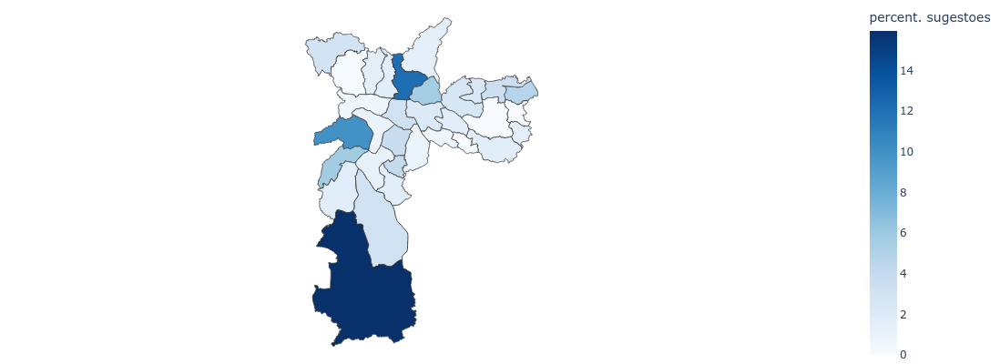

In [182]:
fig = px.choropleth(
        geodf,
        geojson=geodf.geometry,
        locations=geodf.index,
        color = 'percent. sugestoes',
        color_continuous_scale = 'Blues'
        )
fig.update_geos(fitbounds="locations", visible=False)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0}, width=1000, height=400)
fig.show()